In [1]:
import matplotlib.pyplot as plt
from cpymad.madx import Madx
from optics_functions.coupling import coupling_via_cmatrix
from pyhdtoolkit.utils import defaults
from rws.core import (
    get_bare_waist_shift_beam1_config,
    get_bare_waist_shift_beam2_config,
    get_matched_waist_shift_config,
    get_nominal_beam_config,
)
from rws.plotting import (
    plot_betas_comparison,
    plot_betas_deviation,
    plot_phase_advances_comparison,
    plot_phase_differences,
    plot_waist_shift_betabeatings,
    plot_waist_shift_betabeatings_comparison,
)
from rws.utils import betabeating, get_independent_quadrupoles_powering_knobs, get_triplets_powering_knobs, powering_delta

plt.rcParams.update(defaults._SPHINX_GALLERY_PARAMS)
defaults.config_logger(level="debug")
%matplotlib inline
%config InlineBackend.figure_format = "retina"

In [2]:
RWSK_UNIT_SETTING = 1
FIGSIZE = (22, 10)
SEQUENCE = "/Users/felixsoubelet/cernbox/OMC/MADX_scripts/LHC_runII_2018/lhc_as-built.seq"
OPTICSFILE = "/Users/felixsoubelet/cernbox/OMC/MADX_scripts/LHC_runII_2018/PROTON/opticsfile.22"

# Beam 1

## Get Nominal B1 Configuration (Twiss + powering knobs)

In [3]:
from pathlib import Path

In [7]:
# with open("nominal_b1.out", "w") as output:
with Path("nominal_b1.madx").open("w") as commands, Path("nominal_b1.out").open("w") as outputs:
    with Madx(command_log=commands, stdout=outputs) as madxb1:
        madxb1.option(echo=False, warn=False)
        madxb1.call(SEQUENCE)
        madxb1.call(OPTICSFILE)

        nominal_twiss_b1, nominal_triplets_b1, nominal_quads_b1 = get_nominal_beam_config(madxb1, beam=1, ip=1, qx=62.31, qy=60.32)

2022-03-01 17:47:10 | DEBUG    | rws.core:61 - Setting up nominal beam and matching tunes
2022-03-01 17:47:10 | DEBUG    | pyhdtoolkit.cpymadtools.lhc:628 - Re-cycling sequence 'lhcb1' from MSIA.EXIT.B1
2022-03-01 17:47:10 | INFO     | pyhdtoolkit.cpymadtools.lhc:66 - Making default beams for 'lhcb1' and 'lhbc2' sequences
2022-03-01 17:47:10 | DEBUG    | pyhdtoolkit.cpymadtools.orbit:106 - Getting orbit variables
2022-03-01 17:47:10 | INFO     | pyhdtoolkit.cpymadtools.matching:187 - Doing combined matching to Qx=62.31, Qy=60.32, dqx=2.0, dqy=2.0 for sequence 'lhcb1'
2022-03-01 17:47:10 | DEBUG    | pyhdtoolkit.cpymadtools.matching:174 - Executing matching commands, using sequence 'lhcb1'
2022-03-01 17:47:33 | INFO     | pyhdtoolkit.cpymadtools.twiss:121 - Exporting internal TWISS and SUMM tables to TfsDataFrame
2022-03-01 17:47:33 | DEBUG    | rws.utils:33 - Querying triplets powering knob values around IP1.
2022-03-01 17:47:33 | DEBUG    | rws.utils:53 - Querying powering knob values

## Apply Simple RWSK and Get B1 Configuration (Twiss + powering knobs)

In [4]:
b1_waist = open("waist_shift_b1.out", "w")

In [5]:
madxb1 = Madx(command_log="waist_shift_b1.madx", stdout=b1_waist)
madxb1.option(echo=False, warn=False)
madxb1.call(SEQUENCE)
madxb1.call(OPTICSFILE)

bare_twiss_b1, bare_triplets_b1, bare_quads_b1 = get_bare_waist_shift_beam1_config(
    madxb1, ip=1, rigidty_waist_shift_value=RWSK_UNIT_SETTING, qx=62.31, qy=60.32
)

2022-03-01 17:24:32 | DEBUG    | rws.core:61 - Setting up nominal beam and matching tunes
2022-03-01 17:24:32 | DEBUG    | pyhdtoolkit.cpymadtools.lhc:628 - Re-cycling sequence 'lhcb1' from MSIA.EXIT.B1
2022-03-01 17:24:32 | INFO     | pyhdtoolkit.cpymadtools.lhc:66 - Making default beams for 'lhcb1' and 'lhbc2' sequences
2022-03-01 17:24:32 | DEBUG    | pyhdtoolkit.cpymadtools.orbit:106 - Getting orbit variables
2022-03-01 17:24:33 | INFO     | pyhdtoolkit.cpymadtools.matching:187 - Doing combined matching to Qx=62.27, Qy=60.36, dqx=2.0, dqy=2.0 for sequence 'lhcb1'
2022-03-01 17:24:33 | DEBUG    | pyhdtoolkit.cpymadtools.matching:174 - Executing matching commands, using sequence 'lhcb1'
2022-03-01 17:24:57 | INFO     | pyhdtoolkit.cpymadtools.twiss:121 - Exporting internal TWISS and SUMM tables to TfsDataFrame
2022-03-01 17:24:57 | DEBUG    | rws.utils:33 - Querying triplets powering knob values around IP1.
2022-03-01 17:24:57 | DEBUG    | rws.utils:53 - Querying powering knob values

In [6]:
bare_twiss_b1[["F1001", "F1010"]] = coupling_via_cmatrix(bare_twiss_b1, output=["rdts"])
bare_twiss_b1["BBX"] = betabeating(nominal_twiss_b1.BETX, bare_twiss_b1.BETX)
bare_twiss_b1["BBY"] = betabeating(nominal_twiss_b1.BETY, bare_twiss_b1.BETY)

## Improve RWSK with Matching and Get B1 Configuration (Twiss + powering knobs)

In [7]:
matched_twiss_b1, matched_triplets_b1, matched_quads_b1 = get_matched_waist_shift_config(
    madxb1, beam=1, ip=1, nominal_twiss=nominal_twiss_b1, bare_twiss=bare_twiss_b1, qx=62.31, qy=60.32
)

2022-03-01 17:25:21 | DEBUG    | rws.core:216 - Defining matching points to improve the waist shift
2022-03-01 17:25:21 | DEBUG    | rws.core:223 - Match point names are: 'IP1', 'MQXA.3L1', 'MQXA.3R1', 'MQ.11L1.B1', 'MQ.11R1.B1'
2022-03-01 17:25:21 | DEBUG    | rws.core:228 - Matching for the beta-functions and dispersion
2022-03-01 17:25:21 | DEBUG    | pyhdtoolkit.cpymadtools.lhc:468 - Preparing a knob involving quadrupoles [4, 5, 6, 7, 8, 9, 10]
2022-03-01 17:28:29 | INFO     | pyhdtoolkit.cpymadtools.matching:187 - Doing combined matching to Qx=62.31, Qy=60.32, dqx=2.0, dqy=2.0 for sequence 'lhcb1'
2022-03-01 17:28:29 | DEBUG    | pyhdtoolkit.cpymadtools.matching:174 - Executing matching commands, using sequence 'lhcb1'
2022-03-01 17:28:50 | INFO     | pyhdtoolkit.cpymadtools.twiss:121 - Exporting internal TWISS and SUMM tables to TfsDataFrame
2022-03-01 17:28:50 | DEBUG    | rws.utils:33 - Querying triplets powering knob values around IP1.
2022-03-01 17:28:50 | DEBUG    | rws.util

In [8]:
matched_twiss_b1[["F1001", "F1010"]] = coupling_via_cmatrix(matched_twiss_b1, output=["rdts"])
matched_twiss_b1["BBX"] = betabeating(nominal_twiss_b1.BETX, matched_twiss_b1.BETX)
matched_twiss_b1["BBY"] = betabeating(nominal_twiss_b1.BETY, matched_twiss_b1.BETY)

In [9]:
madxb1.exit()
b1_waist.close()

## Plotting

2022-03-01 17:28:50 | DEBUG    | rws.plotting:33 - Plotting waist shift induced beta-beating.


Text(0.5, 1.0, 'Waist Shift Induced Beta-Beating')

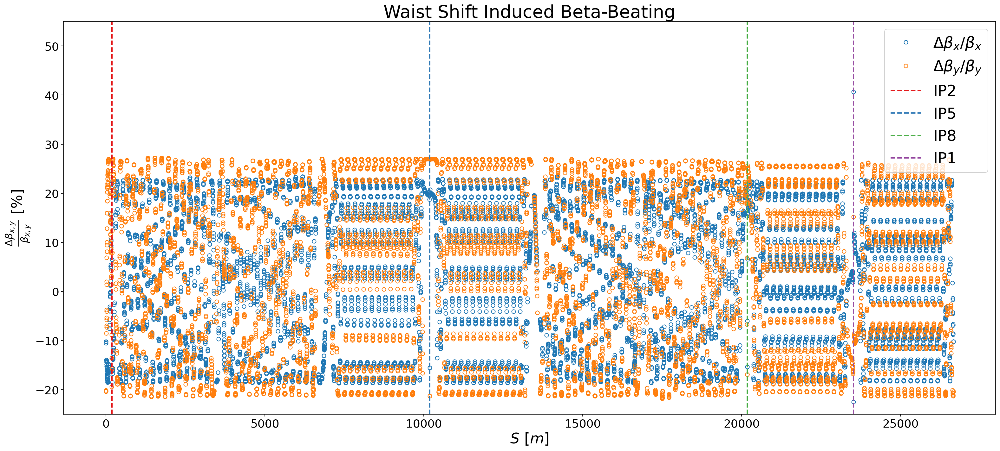

In [10]:
fig, axis = plt.subplots(figsize=FIGSIZE)
plot_waist_shift_betabeatings(axis, bare_twiss_b1, show_ips=True)
axis.set_ylim(-25, 55)
axis.set_title("Waist Shift Induced Beta-Beating")

2022-03-01 17:28:51 | DEBUG    | rws.plotting:33 - Plotting waist shift induced beta-beating.


Text(0.5, 1.0, 'Waist Shift Induced Beta-Beating, After Matching')

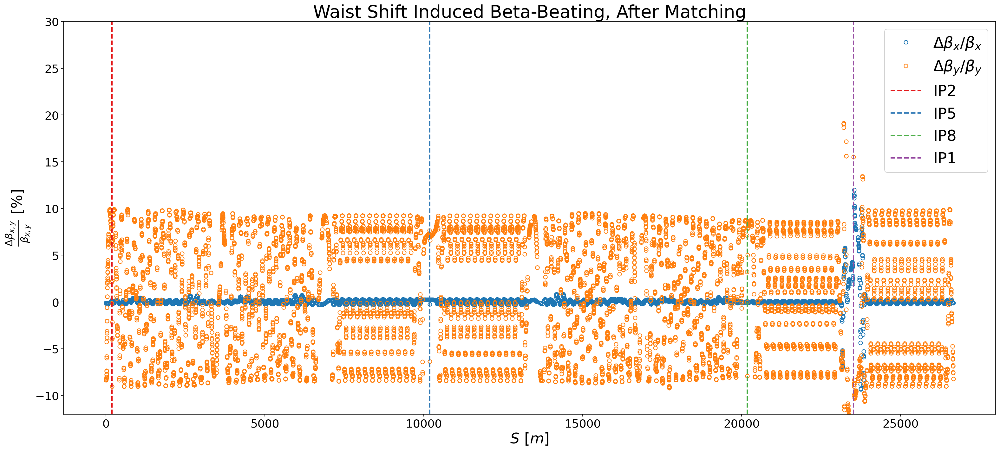

In [11]:
fig, axis = plt.subplots(figsize=FIGSIZE)
plot_waist_shift_betabeatings(axis, matched_twiss_b1, show_ips=True)
axis.set_ylim(-12, 30)
axis.set_title("Waist Shift Induced Beta-Beating, After Matching")
# plt.xlim(19500, 20500)

2022-03-01 17:28:51 | DEBUG    | rws.plotting:72 - Plotting waist shift induced beta-beating before and after matching.
2022-03-01 17:28:51 | DEBUG    | rws.plotting:72 - Plotting waist shift induced beta-beating before and after matching.


Text(0.5, 0, 'S [m]')

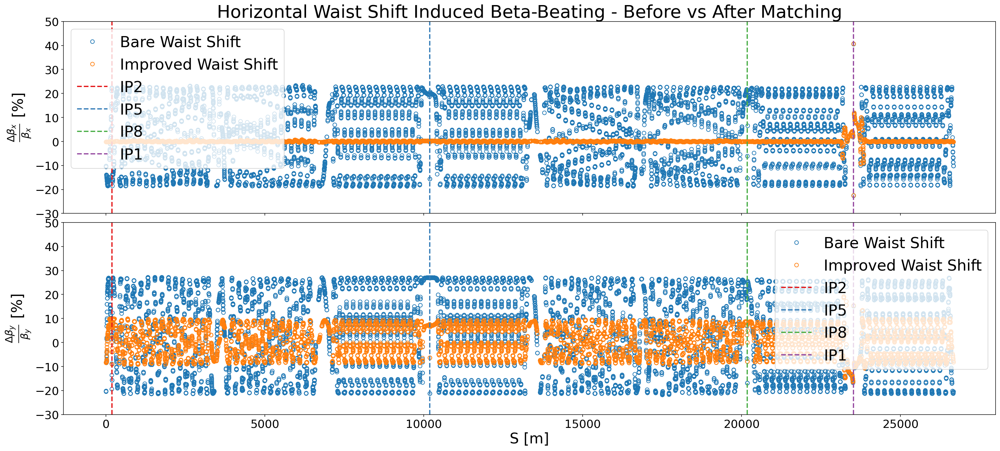

In [12]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)
plot_waist_shift_betabeatings_comparison(axx, bare_twiss_b1, matched_twiss_b1, column="BBX", show_ips=True)
plot_waist_shift_betabeatings_comparison(axy, bare_twiss_b1, matched_twiss_b1, column="BBY", show_ips=True)
axx.set_ylim(-30, 50)
axy.set_ylim(-30, 50)
axx.set_title("Horizontal Waist Shift Induced Beta-Beating - Before vs After Matching")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

2022-03-01 17:28:52 | DEBUG    | rws.plotting:117 - Plotting beta functions for nominal, bare waist shift and improved waist shift scenarii.
2022-03-01 17:28:52 | DEBUG    | rws.plotting:117 - Plotting beta functions for nominal, bare waist shift and improved waist shift scenarii.


Text(0.5, 0, 'S [m]')

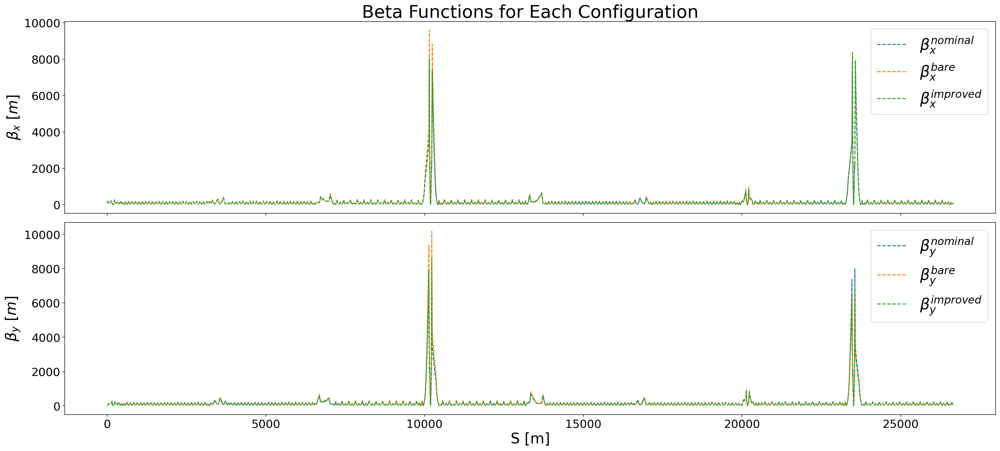

In [13]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)

plot_betas_comparison(axx, nominal_twiss_b1, bare_twiss_b1, matched_twiss_b1, column="BETX")
plot_betas_comparison(axy, nominal_twiss_b1, bare_twiss_b1, matched_twiss_b1, column="BETY")
axx.set_title("Beta Functions for Each Configuration")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

2022-03-01 17:28:52 | DEBUG    | rws.plotting:173 - Plotting beta functions deviation from nominal, for bare waist shift and improved waist shift scenarii.
2022-03-01 17:28:52 | DEBUG    | rws.plotting:173 - Plotting beta functions deviation from nominal, for bare waist shift and improved waist shift scenarii.


Text(0.5, 0, 'S [m]')

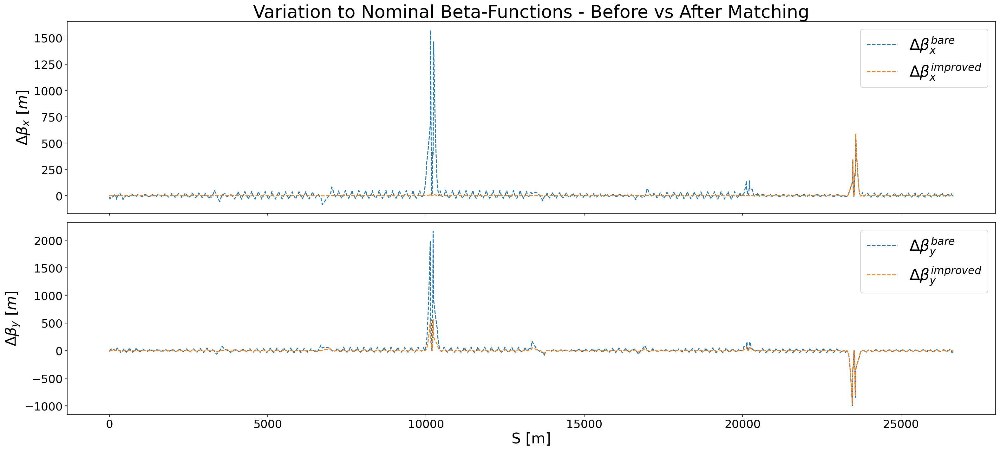

In [14]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)

plot_betas_deviation(axx, nominal_twiss_b1, bare_twiss_b1, matched_twiss_b1, column="BETX")
plot_betas_deviation(axy, nominal_twiss_b1, bare_twiss_b1, matched_twiss_b1, column="BETY")
axx.set_title("Variation to Nominal Beta-Functions - Before vs After Matching")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

2022-03-01 17:28:53 | DEBUG    | rws.plotting:227 - Plotting phase advances for nominal, bare waist shift and improved waist shift scenarii.
2022-03-01 17:28:53 | DEBUG    | rws.plotting:227 - Plotting phase advances for nominal, bare waist shift and improved waist shift scenarii.


Text(0.5, 0, 'S [m]')

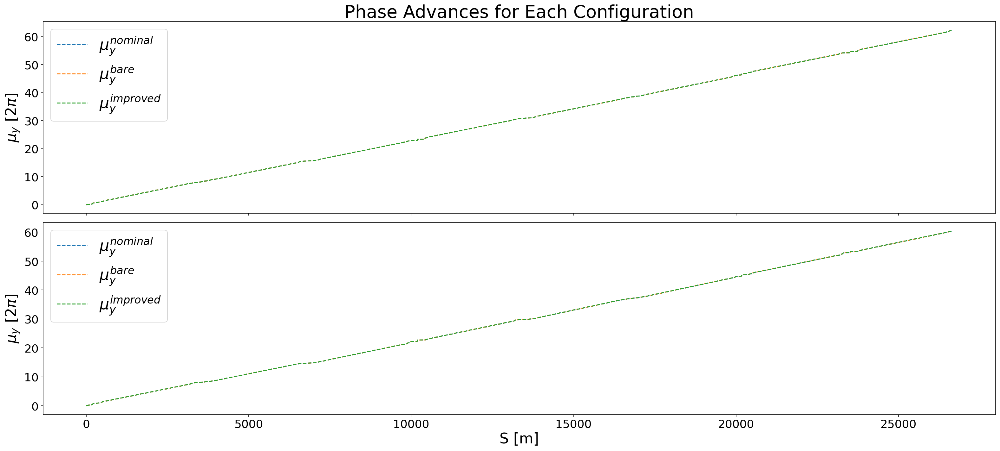

In [15]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)

plot_phase_advances_comparison(axx, nominal_twiss_b1, bare_twiss_b1, matched_twiss_b1, column="MUX")
plot_phase_advances_comparison(axy, nominal_twiss_b1, bare_twiss_b1, matched_twiss_b1, column="MUY")
axx.set_title("Phase Advances for Each Configuration")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

2022-03-01 17:28:53 | DEBUG    | rws.plotting:285 - Plotting phase advances for nominal, bare waist shift and improved waist shift scenarii.
2022-03-01 17:28:53 | DEBUG    | rws.plotting:285 - Plotting phase advances for nominal, bare waist shift and improved waist shift scenarii.


Text(0.5, 0, 'S [m]')

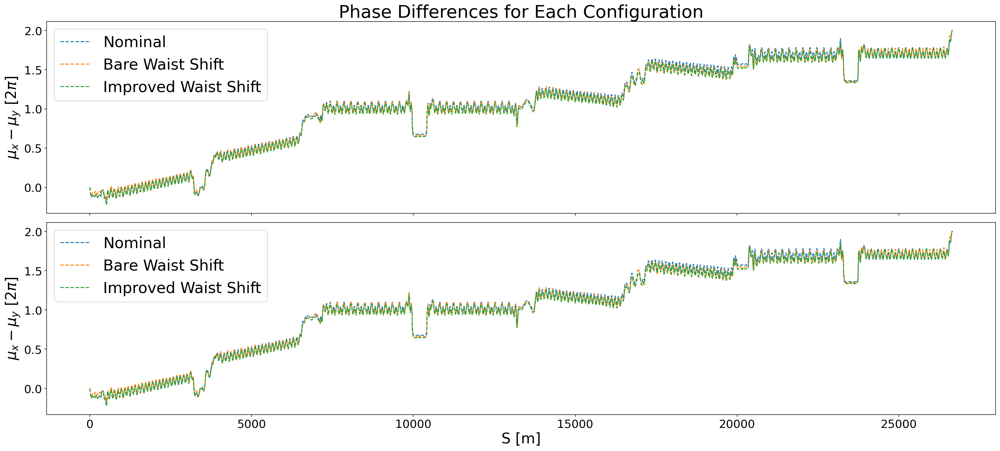

In [16]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)

plot_phase_differences(axx, nominal_twiss_b1, bare_twiss_b1, matched_twiss_b1)
plot_phase_differences(axy, nominal_twiss_b1, bare_twiss_b1, matched_twiss_b1)
axx.set_title("Phase Differences for Each Configuration")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

---

# Beam 2

## Get Nominal B2 Configuration (Twiss + powering knobs)

In [17]:
with open("nominal_b2.out", "w") as output:
    with Madx(command_log="nominal_b2.madx", stdout=output) as madxb2:
        madxb2.option(echo=False, warn=False)
        madxb2.call(SEQUENCE)
        madxb2.call(OPTICSFILE)

        nominal_twiss_b2, nominal_triplets_b2, nominal_quads_b2 = get_nominal_beam_config(madxb2, beam=2, ip=1, qx=62.31, qy=60.32)

2022-03-01 17:28:54 | DEBUG    | rws.core:61 - Setting up nominal beam and matching tunes
2022-03-01 17:28:54 | DEBUG    | pyhdtoolkit.cpymadtools.lhc:628 - Re-cycling sequence 'lhcb2' from MSIA.EXIT.B2
2022-03-01 17:28:54 | INFO     | pyhdtoolkit.cpymadtools.lhc:66 - Making default beams for 'lhcb1' and 'lhbc2' sequences
2022-03-01 17:28:54 | DEBUG    | pyhdtoolkit.cpymadtools.orbit:106 - Getting orbit variables
2022-03-01 17:28:54 | INFO     | pyhdtoolkit.cpymadtools.matching:187 - Doing combined matching to Qx=62.31, Qy=60.32, dqx=2.0, dqy=2.0 for sequence 'lhcb2'
2022-03-01 17:28:54 | DEBUG    | pyhdtoolkit.cpymadtools.matching:174 - Executing matching commands, using sequence 'lhcb2'
2022-03-01 17:29:15 | INFO     | pyhdtoolkit.cpymadtools.twiss:121 - Exporting internal TWISS and SUMM tables to TfsDataFrame
2022-03-01 17:29:15 | DEBUG    | rws.utils:33 - Querying triplets powering knob values around IP1.
2022-03-01 17:29:15 | DEBUG    | rws.utils:53 - Querying powering knob values

## Apply RWS Triplets Knobs from B1 and Get B2 Configuration (Twiss + powering knobs)

In [18]:
b2_waist = open("waist_shift_b2.out", "w")

In [19]:
madxb2 = Madx(command_log="waist_shift_b2.madx", stdout=b2_waist)
madxb2.option(echo=False, warn=False)
madxb2.call(SEQUENCE)
madxb2.call(OPTICSFILE)

bare_twiss_b2, bare_triplets_b2, bare_quads_b2 = get_bare_waist_shift_beam2_config(
    madxb2, ip=1, triplet_knobs=matched_triplets_b1, qx=62.31, qy=60.32
)

2022-03-01 17:29:16 | DEBUG    | rws.core:61 - Setting up nominal beam and matching tunes
2022-03-01 17:29:16 | DEBUG    | pyhdtoolkit.cpymadtools.lhc:628 - Re-cycling sequence 'lhcb2' from MSIA.EXIT.B2
2022-03-01 17:29:16 | INFO     | pyhdtoolkit.cpymadtools.lhc:66 - Making default beams for 'lhcb1' and 'lhbc2' sequences
2022-03-01 17:29:16 | DEBUG    | pyhdtoolkit.cpymadtools.orbit:106 - Getting orbit variables
2022-03-01 17:29:16 | INFO     | pyhdtoolkit.cpymadtools.matching:187 - Doing combined matching to Qx=62.27, Qy=60.36, dqx=2.0, dqy=2.0 for sequence 'lhcb2'
2022-03-01 17:29:16 | DEBUG    | pyhdtoolkit.cpymadtools.matching:174 - Executing matching commands, using sequence 'lhcb2'
2022-03-01 17:29:34 | INFO     | pyhdtoolkit.cpymadtools.twiss:121 - Exporting internal TWISS and SUMM tables to TfsDataFrame
2022-03-01 17:29:34 | DEBUG    | rws.utils:33 - Querying triplets powering knob values around IP1.
2022-03-01 17:29:34 | DEBUG    | rws.utils:53 - Querying powering knob values

In [20]:
bare_twiss_b2[["F1001", "F1010"]] = coupling_via_cmatrix(bare_twiss_b2, output=["rdts"])
bare_twiss_b2["BBX"] = betabeating(nominal_twiss_b2.BETX, bare_twiss_b2.BETX)
bare_twiss_b2["BBY"] = betabeating(nominal_twiss_b2.BETY, bare_twiss_b2.BETY)

## Improve RWSK with Matching and Get B2 Configuration (Twiss + powering knobs)

In [21]:
matched_twiss_b2, matched_triplets_b2, matched_quads_b2 = get_matched_waist_shift_config(
    madxb2, beam=2, ip=1, nominal_twiss=nominal_twiss_b2, bare_twiss=bare_twiss_b2, qx=62.31, qy=60.32
)

2022-03-01 17:29:57 | DEBUG    | rws.core:216 - Defining matching points to improve the waist shift
2022-03-01 17:29:57 | DEBUG    | rws.core:223 - Match point names are: 'IP1', 'MQXA.3L1', 'MQXA.3R1', 'MQ.11L1.B2', 'MQ.11R1.B2'
2022-03-01 17:29:57 | DEBUG    | rws.core:228 - Matching for the beta-functions and dispersion
2022-03-01 17:29:58 | DEBUG    | pyhdtoolkit.cpymadtools.lhc:468 - Preparing a knob involving quadrupoles [4, 5, 6, 7, 8, 9, 10]
2022-03-01 17:33:05 | INFO     | pyhdtoolkit.cpymadtools.matching:187 - Doing combined matching to Qx=62.31, Qy=60.32, dqx=2.0, dqy=2.0 for sequence 'lhcb2'
2022-03-01 17:33:05 | DEBUG    | pyhdtoolkit.cpymadtools.matching:174 - Executing matching commands, using sequence 'lhcb2'
2022-03-01 17:33:23 | INFO     | pyhdtoolkit.cpymadtools.twiss:121 - Exporting internal TWISS and SUMM tables to TfsDataFrame
2022-03-01 17:33:23 | DEBUG    | rws.utils:33 - Querying triplets powering knob values around IP1.
2022-03-01 17:33:23 | DEBUG    | rws.util

In [22]:
matched_twiss_b2[["F1001", "F1010"]] = coupling_via_cmatrix(matched_twiss_b2, output=["rdts"])
matched_twiss_b2["BBX"] = betabeating(nominal_twiss_b2.BETX, matched_twiss_b2.BETX)
matched_twiss_b2["BBY"] = betabeating(nominal_twiss_b2.BETY, matched_twiss_b2.BETY)

In [23]:
madxb2.exit()
b2_waist.close()

## Plotting

2022-03-01 17:33:23 | DEBUG    | rws.plotting:33 - Plotting waist shift induced beta-beating.


Text(0.5, 1.0, 'Beam 2 Waist Shift Induced Beta-Beating')

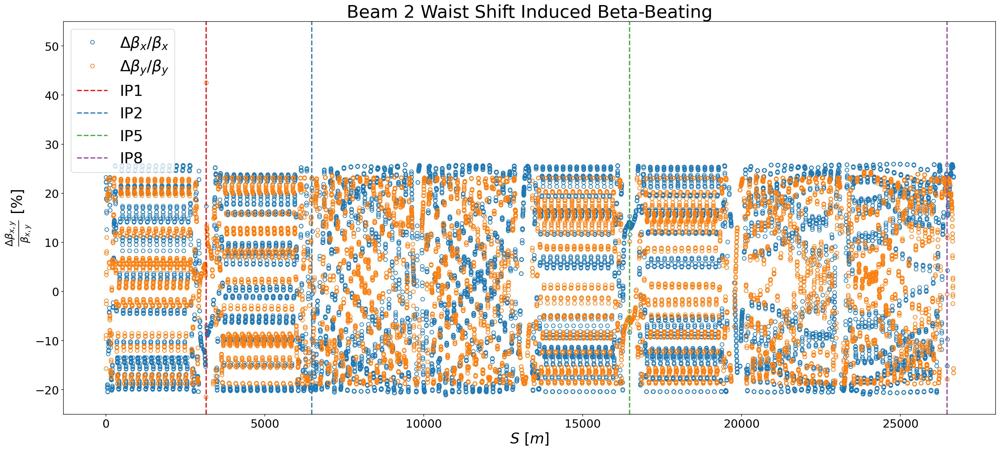

In [24]:
fig, axis = plt.subplots(figsize=FIGSIZE)
plot_waist_shift_betabeatings(axis, bare_twiss_b2, show_ips=True)
axis.set_ylim(-25, 55)
axis.set_title("Beam 2 Waist Shift Induced Beta-Beating")

2022-03-01 17:33:24 | DEBUG    | rws.plotting:33 - Plotting waist shift induced beta-beating.


Text(0.5, 1.0, 'Beam 2 Waist Shift Induced Beta-Beating, After Matching')

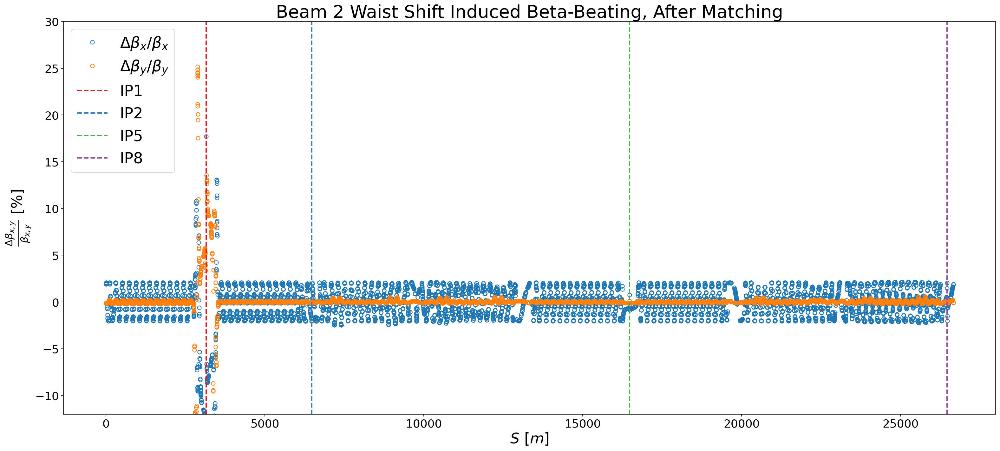

In [25]:
fig, axis = plt.subplots(figsize=FIGSIZE)
plot_waist_shift_betabeatings(axis, matched_twiss_b2, show_ips=True)
axis.set_ylim(-12, 30)
axis.set_title("Beam 2 Waist Shift Induced Beta-Beating, After Matching")
# plt.xlim(19500, 20500)

2022-03-01 17:33:24 | DEBUG    | rws.plotting:72 - Plotting waist shift induced beta-beating before and after matching.
2022-03-01 17:33:24 | DEBUG    | rws.plotting:72 - Plotting waist shift induced beta-beating before and after matching.


Text(0.5, 0, 'S [m]')

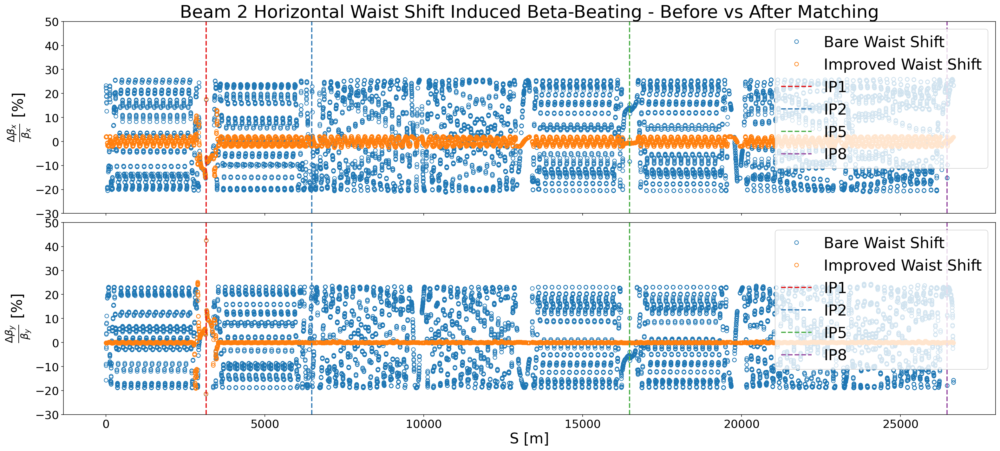

In [26]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)
plot_waist_shift_betabeatings_comparison(axx, bare_twiss_b2, matched_twiss_b2, column="BBX", show_ips=True)
plot_waist_shift_betabeatings_comparison(axy, bare_twiss_b2, matched_twiss_b2, column="BBY", show_ips=True)
axx.set_ylim(-30, 50)
axy.set_ylim(-30, 50)
axx.set_title("Beam 2 Horizontal Waist Shift Induced Beta-Beating - Before vs After Matching")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

2022-03-01 17:33:25 | DEBUG    | rws.plotting:117 - Plotting beta functions for nominal, bare waist shift and improved waist shift scenarii.
2022-03-01 17:33:25 | DEBUG    | rws.plotting:117 - Plotting beta functions for nominal, bare waist shift and improved waist shift scenarii.


Text(0.5, 0, 'S [m]')

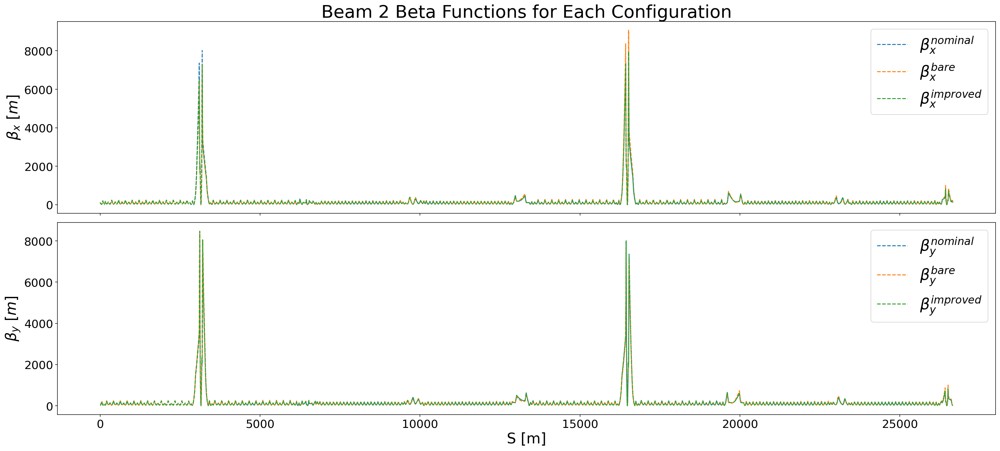

In [27]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)

plot_betas_comparison(axx, nominal_twiss_b2, bare_twiss_b2, matched_twiss_b2, column="BETX")
plot_betas_comparison(axy, nominal_twiss_b2, bare_twiss_b2, matched_twiss_b2, column="BETY")
axx.set_title("Beam 2 Beta Functions for Each Configuration")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

2022-03-01 17:33:25 | DEBUG    | rws.plotting:173 - Plotting beta functions deviation from nominal, for bare waist shift and improved waist shift scenarii.
2022-03-01 17:33:25 | DEBUG    | rws.plotting:173 - Plotting beta functions deviation from nominal, for bare waist shift and improved waist shift scenarii.


Text(0.5, 0, 'S [m]')

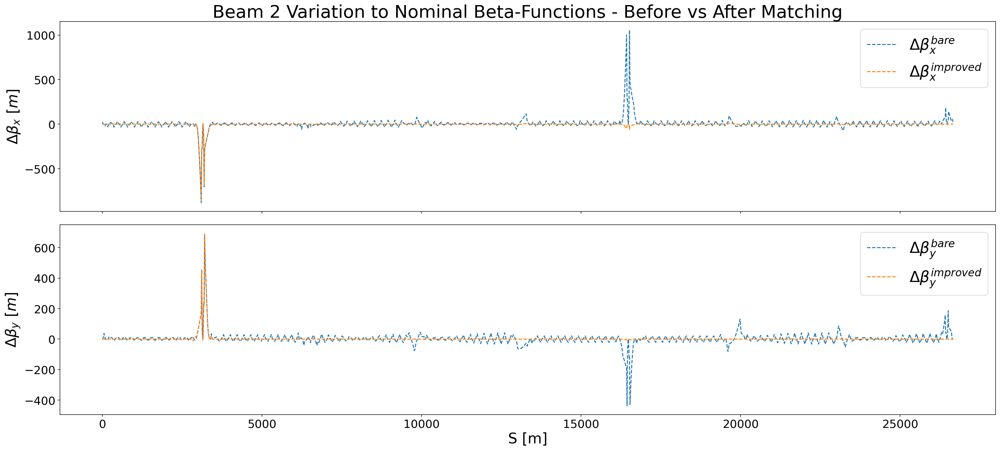

In [28]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)

plot_betas_deviation(axx, nominal_twiss_b2, bare_twiss_b2, matched_twiss_b2, column="BETX")
plot_betas_deviation(axy, nominal_twiss_b2, bare_twiss_b2, matched_twiss_b2, column="BETY")
axx.set_title("Beam 2 Variation to Nominal Beta-Functions - Before vs After Matching")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

2022-03-01 17:33:25 | DEBUG    | rws.plotting:227 - Plotting phase advances for nominal, bare waist shift and improved waist shift scenarii.
2022-03-01 17:33:25 | DEBUG    | rws.plotting:227 - Plotting phase advances for nominal, bare waist shift and improved waist shift scenarii.


Text(0.5, 0, 'S [m]')

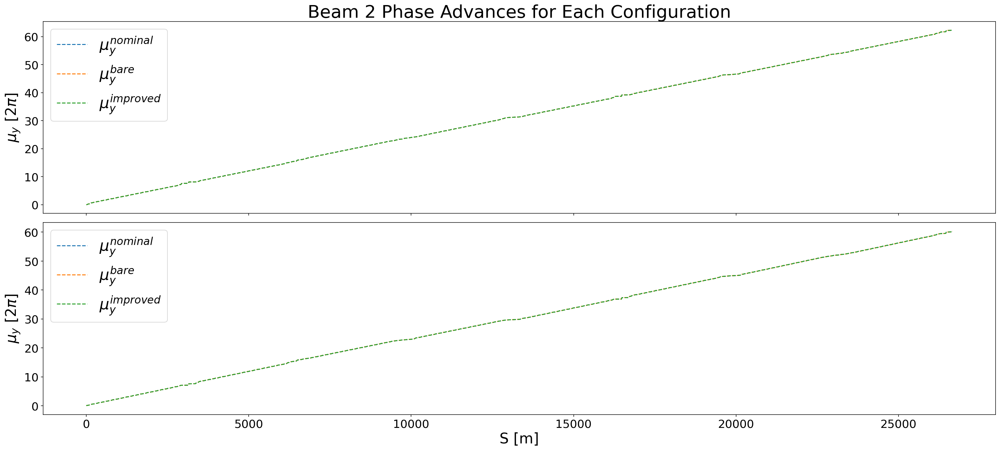

In [29]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)

plot_phase_advances_comparison(axx, nominal_twiss_b2, bare_twiss_b2, matched_twiss_b2, column="MUX")
plot_phase_advances_comparison(axy, nominal_twiss_b2, bare_twiss_b2, matched_twiss_b2, column="MUY")
axx.set_title("Beam 2 Phase Advances for Each Configuration")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

2022-03-01 17:33:26 | DEBUG    | rws.plotting:285 - Plotting phase advances for nominal, bare waist shift and improved waist shift scenarii.
2022-03-01 17:33:26 | DEBUG    | rws.plotting:285 - Plotting phase advances for nominal, bare waist shift and improved waist shift scenarii.


Text(0.5, 0, 'S [m]')

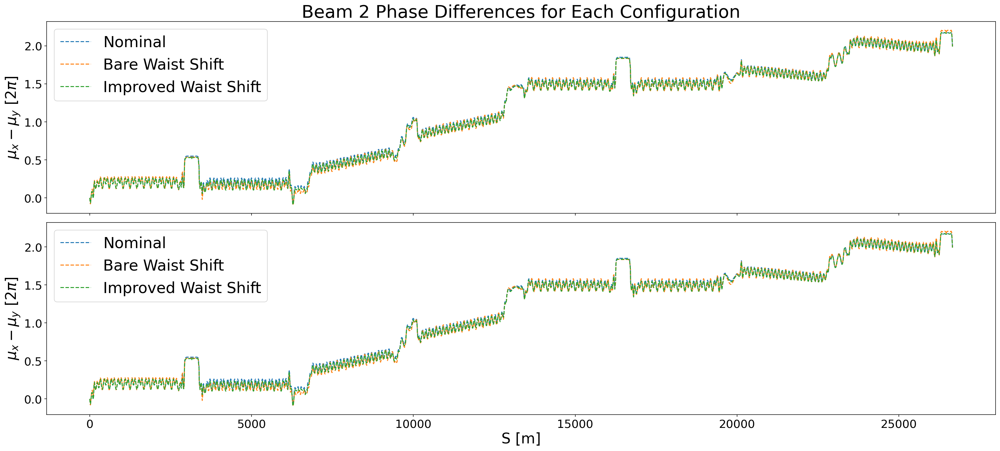

In [30]:
fig, (axx, axy) = plt.subplots(2, 1, figsize=FIGSIZE, sharex=True)

plot_phase_differences(axx, nominal_twiss_b2, bare_twiss_b2, matched_twiss_b2)
plot_phase_differences(axy, nominal_twiss_b2, bare_twiss_b2, matched_twiss_b2)
axx.set_title("Beam 2 Phase Differences for Each Configuration")
axy.set_xlabel("S [m]")
# plt.xlim(19500, 20500)

---

In [31]:
# Sanity check
assert matched_triplets_b1 == matched_triplets_b2

- [x] Plot the global phase advance in each case too (mux/muy versus S)
- [x] Can also do mux - muy because it drives the f1001

At the end:
- [ ] have the better waist shift in
- [ ] put in a little bit of crossing angles and see that the orbit starts changing
- [ ] try to do a bit of correction (`CORRECT` in MAD-X)

Caveat: would have to disable the use of the crossing angle correctors knobs